# Practical Session 2 Regression

## Necessary Imports

In [1]:
import numpy as np
import pylab as pl
import scipy as sp
import matplotlib.pyplot as plt
import sklearn 
import pandas as pd

## 2. Data visualization and pre-processing 

### Collecting model's score

In [15]:
score_model=[]

### Data Loading

In [3]:
data=np.load('ECoG.npz')
Xall=data.get('Xall')
Yall=data.get('Yall')
fe=data.get('Fe')
fe=int(fe[0][0])
print('Xall :',Xall.shape)
print('Yall :',Yall.shape)
print('Fe :',fe)

Xall : (3327, 64)
Yall : (3327, 1)
Fe : 50


##### Question 1: 
-Let's try to compare the signal of each sensor (column) to the flexion of the finger and observe if there's a visible correlation.
> The observation wasn't very succesful as trying to find similarites with human eyes was a bit diffcult. 


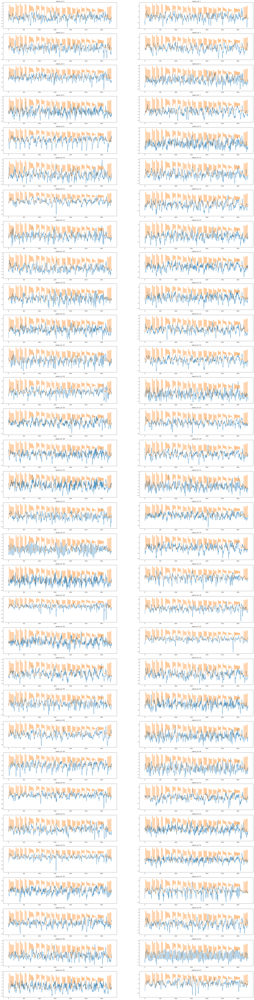

In [4]:

nb_columns=Xall.shape[1]
plot_size=nb_columns//2

fig, axes = plt.subplots(nb_columns//2,2, figsize=(40, 160))
axes=axes.flatten()
for i in range(0,nb_columns):
    
    axes[i].plot(Xall[:,i])
    axes[i].plot(Yall)
    axes[i].set_title(f'signal_col: {i}')
        
#plt.tight_layout()
plt.show()


##### Question 2

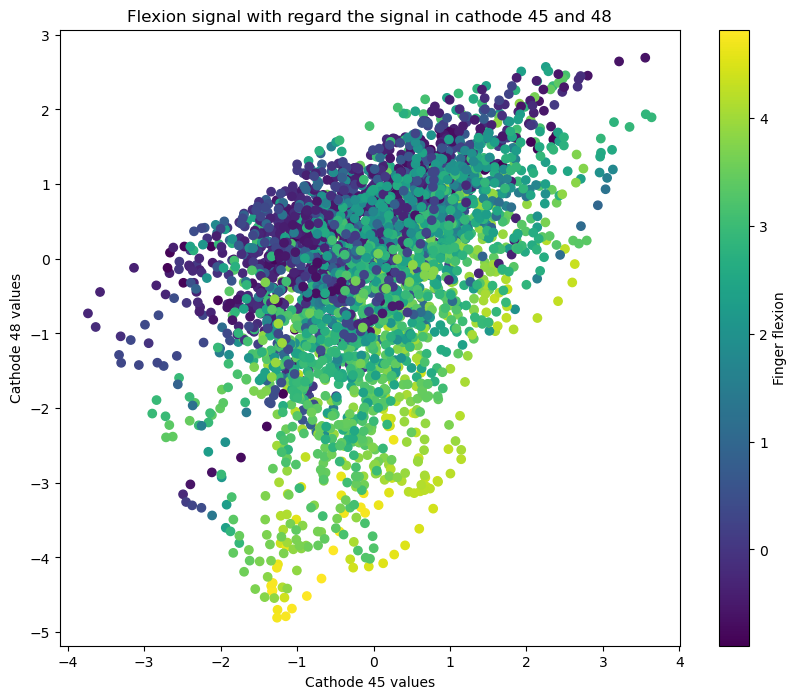

In [5]:
fig, ax = plt.subplots(figsize=(10, 8))

scatter=ax.scatter(Xall[:,45],Xall[:,48],c=Yall,vmin=Yall.min(),vmax=Yall.max())
fig.colorbar(scatter, ax=ax, label='Finger flexion')

ax.set_title('Flexion signal with regard the signal in cathode 45 and 48')
ax.set_xlabel('Cathode 45 values')
ax.set_ylabel('Cathode 48 values')

        
#plt.tight_layout()
plt.show()

*Interepretation*:
- We can observe a certain covariance between the values in Cathode 45 and Cathode 48.
- There's also a kind of a diagonal seperator that seperate points with low flexion and high flexion. it's seems that a negative value on the 48th cathode increse the chances of having a high flexion value (the finger is moving)

##### Question 3 : split into training/test data

In [6]:
x_train=Xall[:1000,:]
x_test=Xall[1000:,:]
print('x_train shape: ',x_train.shape)
print('x_test shape: ',x_test.shape)

x_train shape:  (1000, 64)
x_test shape:  (2327, 64)


In [7]:
y_train=Yall[:1000]
y_test=Yall[1000:]
print('y_train shape: ',y_train.shape)
print('y_test: ',y_test.shape)

y_train shape:  (1000, 1)
y_test:  (2327, 1)


### Least Square Regression

#### Question 1

In [8]:
# add the bias to our X_hat
X_hat=np.concat((np.ones((x_train.shape[0],1)),x_train),axis=1)
X_hat.shape

(1000, 65)

#### Question 2: solve linearly the least square
- the derivative of the least square gives this:  
$$
\tilde{X}^T (\tilde{X} w - y) = 0
$$
$$
\tilde{X}^T\tilde{X} w= \tilde{X}^Ty

$$

Hence in the case of solve function we have: 
$$
A=\tilde{X}^T\tilde{X}
$$
$$
B=\tilde{X}^Ty
$$


In [9]:
A=np.dot(X_hat.T,X_hat)
B=np.dot(X_hat.T,y_train)

In [10]:
w_hat=np.linalg.solve(A,B)
print('w_hat shape: ',w_hat.shape)
b=w_hat[:1]
w=w_hat[1:]
print('b shape: ',b.shape)
print('w shape: ',w.shape)


w_hat shape:  (65, 1)
b shape:  (1, 1)
w shape:  (64, 1)


#### Question 3: predict finger flexion (using the np.linalog.solve)

#####  Train Data prediction

(1000, 1)


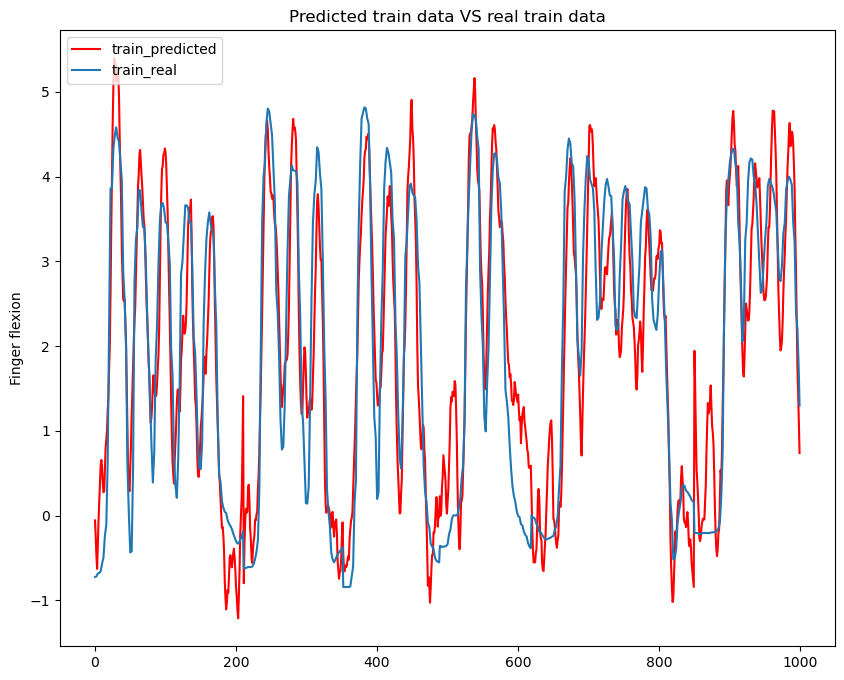

In [11]:
# test our weights on the training set
y_train_predict=np.dot(X_hat,w_hat)
print(y_train_predict.shape)

#plot with real values of training

fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(y_train_predict,c='red',label='train_predicted')
ax.plot(y_train,label='train_real')
ax.legend(loc='upper left')

plt.title('Predicted train data VS real train data')
plt.ylabel('Finger flexion')
plt.show()



*Interpretation*:
- Clearly our prediction would be very close to our trainning data as we used that in our solving algorithm. Here we can also see that the equation follows exactly all the oscilations of the curve (a clear sign of future overfitting).

##### Test Data prediction

(2327, 1)


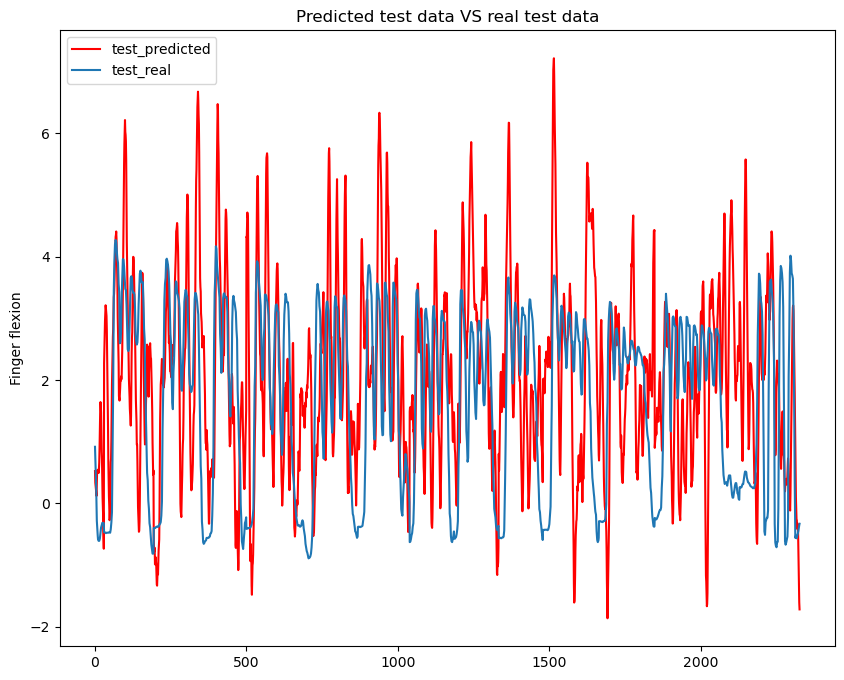

In [12]:
# test our weights on the training set
x_hat_test=np.concat((np.ones((x_test.shape[0],1)),x_test),axis=1)
y_test_predict=np.dot(x_hat_test,w_hat)
print(y_test_predict.shape)

#plot with real values of training

fig, ax = plt.subplots(figsize=(10, 8))

ax.plot(y_test_predict,c='red',label='test_predicted')
ax.plot(y_test,label='test_real')
ax.legend(loc='upper left')


plt.title('Predicted test data VS real test data')
plt.ylabel('Finger flexion')
plt.show()


*Interpretation*:
- We can observe a clear sign that our model is overfitting since the performance wrt to test data isn't very good.
- Furthemrore, we can observe that the errors in the train prediction (some osccilation missed) are enhanced in the test prediction this is mainly due to the fact that our trainning tried to fit exactly the training data and follow the trend of our data. 
 

#### Question 4: Check performance MSE, R²

In [16]:
#MSE 
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('MSE score: ',mse)
print('R² score: ',r2)

#store score
score_model.append(['Least Square',mse,r2])



MSE score:  3.0455368767601607
R² score:  -0.4281700630222518


*Interpretation*:
- The MSE error is qround 3 meaning our avg. error is around sqrt(3)=1.7 and for flexion values ranging between [-0.5:4] this a very large error value. 
- Same reflexion goes for the R² score. With a vlue of -0.42 it's very far from the ideal 1 value we are aiming to attain (in a perfect world). Its even worse the a model that predicts the mean.

#### Question 5: Regression Model 

In [17]:
model=sklearn.linear_model.LinearRegression(fit_intercept=True)
model.fit(x_train,y_train)
print('training score: ',model.score(x_train,y_train))
print('Intercept :',model.intercept_)
print('model coeficient: ',model.coef_)
#Train score around 0.83 maybe we can avoid overfitting with this estimation 

training score:  0.8395001217500111
Intercept : [1.90081255]
model coeficient:  [[-0.09150694  0.10861623 -0.07305774 -0.27938349  0.25112061  0.41213833
   0.14387528 -0.19811799  0.40869961  0.7059866  -0.4557358   0.02140866
   0.35947183 -0.01042572 -0.17655887 -0.03377368 -0.11345198 -0.72143135
  -0.5950915   0.23329595 -0.65132811 -0.33317441  0.28861537  0.24498034
   0.22062027  0.19042788  0.20709995  0.3273775  -0.65410592  0.11997444
  -0.07491945  0.10667581  0.11003235 -0.42910159 -0.22329342 -0.00381723
  -0.06046664 -0.1595164  -0.48519392  0.15019433  0.25855769 -0.09242374
   0.76314124 -0.0834797   0.04489988 -0.16816255  0.04845934  0.0256902
  -1.03905805  0.16060454 -0.19110549  0.16557271  0.08064689  0.27554638
  -0.01162067 -0.00740264  0.33850545  0.22409642 -0.2196636  -0.26866884
  -0.16469195 -0.23638421  0.04244268  0.5694358 ]]


In [18]:
#np.allclose() check if all the elements are close by default. 
# these are the value of relative and absolute differnece by defualt 
# rtol=1.e-5, atol=1.e-8
print("\nIntercept close? ", np.allclose(w_hat[0], model.intercept_))
print("Coefficients close? ", np.allclose(w_hat[1:].flatten(), model.coef_.reshape(-1)))


Intercept close?  True
Coefficients close?  True


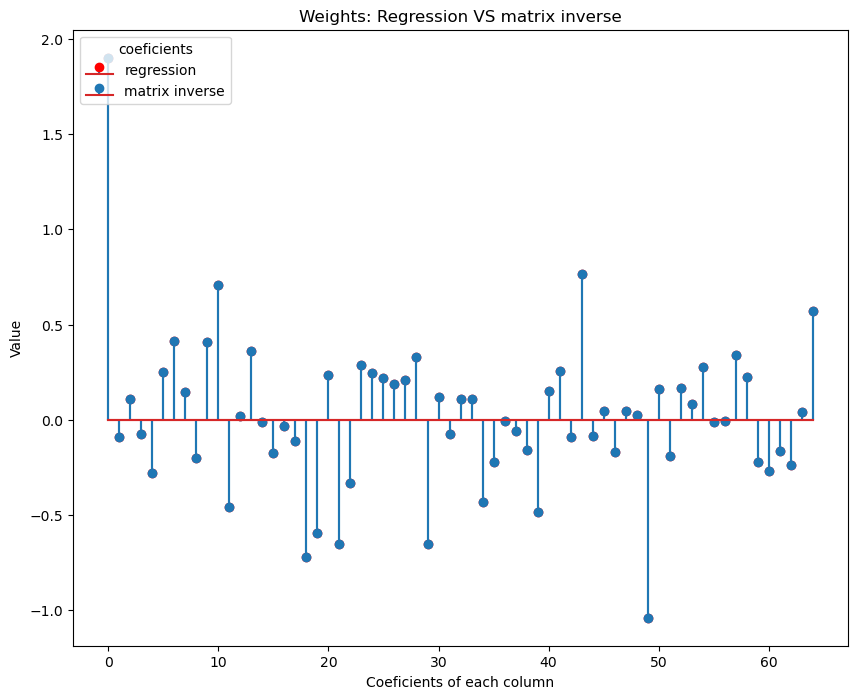

In [21]:
#we can also abserve the values of each weight (intercept included)
regression_values=np.concat((model.intercept_,model.coef_.reshape(-1)),axis=0)

#plot with real values of training
fig, ax = plt.subplots(figsize=(10, 8))

ax.stem(regression_values,markerfmt='red',label='regression')
ax.stem(w_hat,label='matrix inverse')
ax.legend(title='coeficients',loc='upper left')

plt.title('Weights: Regression VS matrix inverse')
plt.ylabel('Value')
plt.xlabel('Coeficients of each column')
plt.show()


In [22]:
y_test_predict=model.predict(x_test)
#MSE 
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('MSE score: ',mse)
print('R² score: ',r2)

#store score
score_model.append(['Linear Regression',mse,r2])



MSE score:  3.04553687676015
R² score:  -0.4281700630222467


*Interpretation:* 
- Here the linear regression realized the same weights (very close) as the Least square methode which is theoritically expected.

### Ridge Regression

#### Question 1: 

In [24]:
#Initialize model
model_ridge=sklearn.linear_model.Ridge(alpha=1.0,fit_intercept=True)

#Fit model
model_ridge.fit(x_train,y_train)

# #Predict model 
y_train_predict=model.predict(x_train)
y_test_predict=model.predict(x_test)

#Evaluate results 
mse=sklearn.metrics.mean_squared_error(y_train,y_train_predict)
r2=sklearn.metrics.r2_score(y_train,y_train_predict)
print('Train MSE score: ',mse)
print('Train R² score: ',r2)

print('---------------------------------')

mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)





Train MSE score:  0.5040654614476061
Train R² score:  0.8395001217500111
---------------------------------
Test MSE score:  3.04553687676015
Test R² score:  -0.4281700630222467


*Interpretation*:
- Our score on test data R² is still negative meaning that our model is arbitrarily worse. Meaning, our model is worst then a model that predicts always the mean of the true target. 
- This could be due to the high value of lambda=1. By definition Ridge regression penalizes big weights and push them to 0, by having a big lambda we are going to push most of our coeficient to zero rendering our model scarce, hence the poor R² score.

#### Question 2: ridge with lambda smaller
$$
\lambda \in [10^{-5}, 10^{-3}]
$$

In [25]:
lambda_range=np.logspace(-3,5,100)
train_y_predict=[]
test_y_predict=[]
parameters=[]

In [26]:
for alpha in lambda_range:
    model=sklearn.linear_model.Ridge(alpha=alpha,fit_intercept=True)
    model.fit(x_train,y_train)
    train_y_predict.append(model.predict(x_train))
    test_y_predict.append(model.predict(x_test))
    parameters.append(model.coef_)
    

In [27]:
train_mse_scores=[]
test_mse_scores=[]
for i in range(0,100):
    #train
    train_mse_scores.append(sklearn.metrics.mean_squared_error(y_train,train_y_predict[i]))
    #test
    test_mse_scores.append(sklearn.metrics.mean_squared_error(y_test,test_y_predict[i]))

In [28]:
train_mse_scores=np.array(train_mse_scores)
test_mse_scores=np.array(test_mse_scores)
parameters=np.array(parameters)

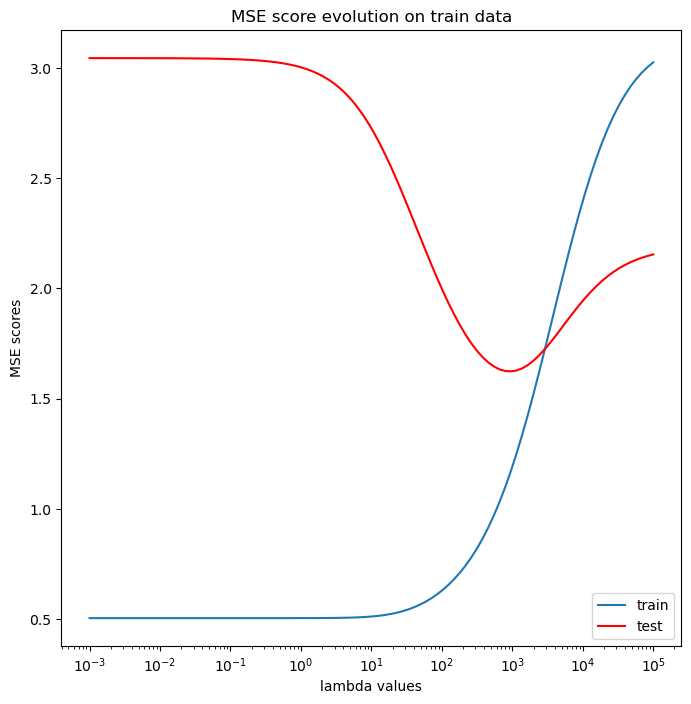

In [29]:
#plot evolution of MSE on training and test data as a function of lambda

fig, ax = plt.subplots(figsize=(8, 8))

#train data
ax.semilogx(lambda_range,train_mse_scores,label='train')
ax.semilogx(lambda_range,test_mse_scores,c='red',label='test')

ax.set_title('MSE score evolution on train data')
ax.set_xlabel('lambda values')
ax.set_ylabel('MSE scores')
ax.legend()



plt.show()


*Interpretation*:
- Train MSE plot: If we focus on this plot we can observe the effect of the regularization on the overfitting. the bigger the lambda to more important our regularization hence the less overfitting we do (this is translated with bigger MSE error).
- Test MSE plot: On this plot the bigger our regularization the better the model perform (MSE gets lower). At one point we get into a minimum of the MSE (the optimal lambda). But after the minimum of MSE increases and hence this showcases higher values of lmabda that push our coeficients to 0 hence rendering our regression very poor (we move into underfitting).

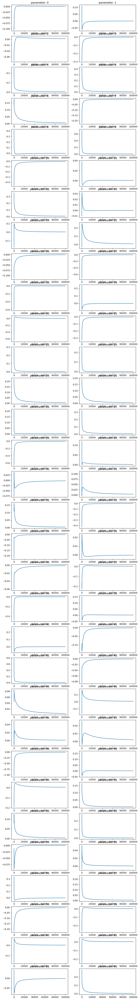

In [30]:

nb_columns=Xall.shape[1]
plot_size=nb_columns//2

fig, axes = plt.subplots(nb_columns//2,2, figsize=(10, 80))
axes=axes.flatten()
for i in range(0,nb_columns):
    
    axes[i].plot(lambda_range,parameters[:,i])
    #axes[i].plot(Yall)
    axes[i].set_title(f'parameter: {i}')
        
#plt.tight_layout()
plt.show()


*Interpretation*: 
- All the parameters converges towards 0, this is mainly because ridge applies a soft shrinkage towards 0. the highest the intiale absolute value of the parameters the stronger the slop is.   

#### Question 3: Model with the best lambda value 

In [31]:
index=test_mse_scores.argmin()
final_lambda=lambda_range[index]
model_ridge=sklearn.linear_model.Ridge(alpha=final_lambda,fit_intercept=True)
print('Model initiated with lambda = ',final_lambda)

Model initiated with lambda =  954.5484566618347


#### Question 4: predict with final model with the best lambda value 

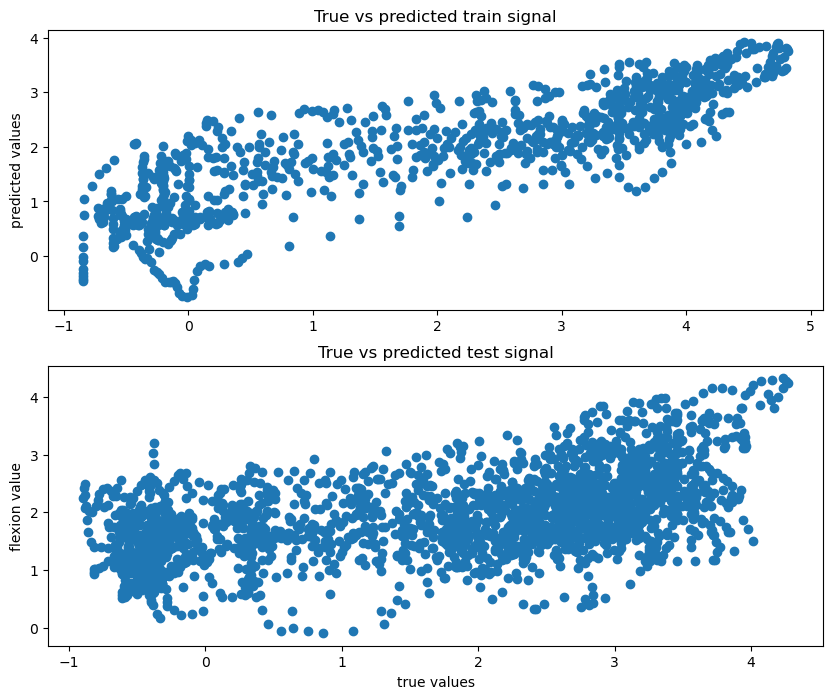

In [32]:
#fit model first
model_ridge.fit(x_train,y_train)

#predict
y_train_predict=model_ridge.predict(x_train)
y_test_predict=model_ridge.predict(x_test)

#plot of true VS predicted 
#plot with real values of training

fig, ax = plt.subplots(2,1,figsize=(10, 8))
#train
ax[0].scatter(y_train,y_train_predict)
ax[0].set_title('True vs predicted train signal')
ax[0].set_ylabel('predicted values')
#test
ax[1].scatter(y_test,y_test_predict)
ax[1].set_xlabel('true values')

ax[1].set_title('True vs predicted test signal')
plt.ylabel('flexion value')
plt.show()



*Interpretation*: 
- we can clearly observe a linear realtion close to the diagonal of y=x in the plot of training data. which means our prediction of train data looks good (abviously). Nonetheless, if we look at the test data, the results still try to keep a linear relation but it's more noisy then in the training set.

#### Question 5: plot the predictions

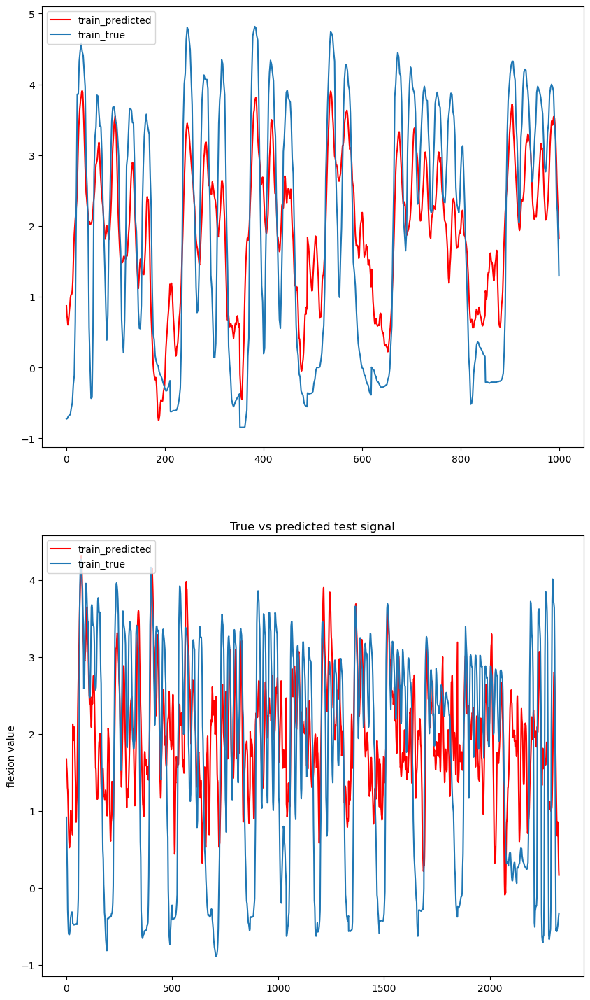

In [33]:
#plot of true VS predicted 

fig, ax = plt.subplots(2,1,figsize=(10, 18))
#train
ax[0].plot(y_train_predict,c='red',label='train_predicted')
ax[0].plot(y_train,label='train_true')
ax[0].legend(loc='upper left')

#test
ax[1].plot(y_test_predict,c='red',label='train_predicted')
ax[1].plot(y_test,label='train_true')
ax[1].legend(loc='upper left')
ax[1].set_title('True vs predicted test signal')
plt.ylabel('flexion value')
plt.show()



*Interpretation*: 
- Our predictions on the train data are worst then the previous models/plots seen. This results from our regularization. 
- Clearly, our predictions for test data are better 
we need to compute the performances to see if our model is better from LS or not 

#### Question 6: Compute the MSE and R² on test data

In [34]:
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)


#store score
score_model.append(['Ridge Regression',mse,r2])


Test MSE score:  1.6239059826952071
Test R² score:  0.23848766129037868


The LS model results:

    MSE score:  3.0455368767601607
    R² score:  -0.4281700630222518

*Interpretation*:
- There's a importante difference from LS and our bast lambda ridge model. we move from a 3.04 to 1.6 which is an important reduce in MSE but also our R² scores go from negative model (abritary model) to a modest 0.23 (this still need to be worked on)

#### Question7: plot of coeficients LS model vs Ridge model

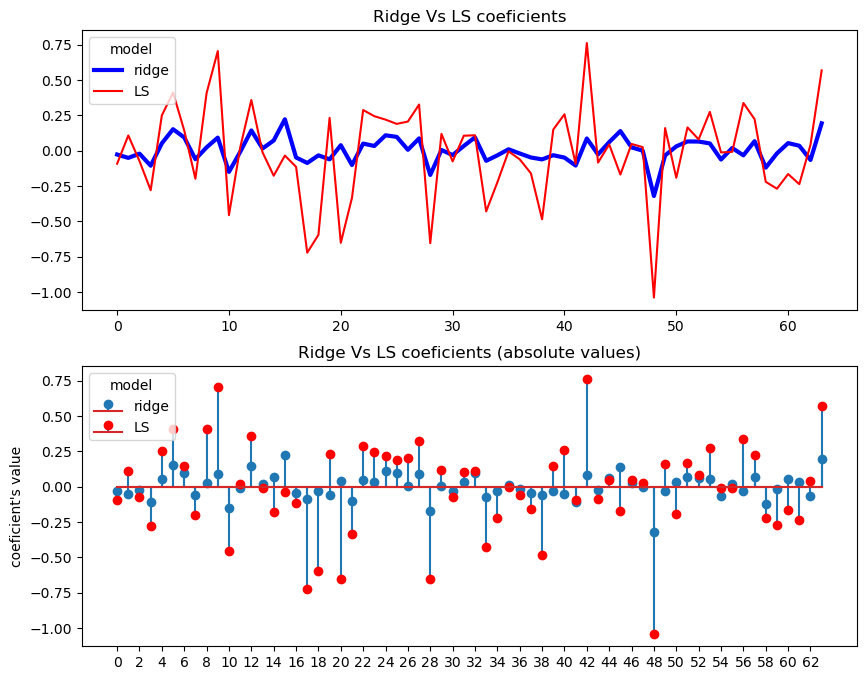

In [35]:
fig, ax = plt.subplots(2,1,figsize=(10, 8))

ax[0].plot(model_ridge.coef_,c='blue',label='ridge',lw=3)
ax[0].plot(w_hat[1:],c='red',label='LS') #don't include the intercept
ax[0].legend(title='model',loc='upper left')
ax[0].set_title('Ridge Vs LS coeficients')

ax[1].stem(model_ridge.coef_,label='ridge')
ax[1].stem(w_hat[1:],label='LS',markerfmt='red') #don't include the intercept
ax[1].legend(title='model',loc='upper left')
ax[1].set_title('Ridge Vs LS coeficients (absolute values)')

plt.xticks(np.arange(0, len(model_ridge.coef_), step=2))

plt.ylabel('coeficient\'s value')
plt.show()


*Interpretation*:
- we can observe the impact of ridge regression on the coeficient. It's obvious that from LS to ridge all of our coeficient have shrunk. 
- A great observation is that very heavy coeficient such as 42,48 or even 9 have had a very important shrinkage. This is mainly due to ridge penalizing heavy weights

### Variable selection with lasso

#### Question 1: lasso predictor

In [36]:
lasso_predictor=sklearn.linear_model.Lasso(fit_intercept=True) #regularization parameter by default
lasso_predictor.fit(x_train,y_train)

,alpha,1.0
,fit_intercept,True
,precompute,False
,copy_X,True
,max_iter,1000
,tol,0.0001
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


#### Question 2: 

In [37]:
# training performances
y_train_predict=lasso_predictor.predict(x_train)
mse=sklearn.metrics.mean_squared_error(y_train,y_train_predict)
r2=sklearn.metrics.r2_score(y_train,y_train_predict)
print('Train MSE score: ',mse)
print('Train R² score: ',r2)

print("----------------------------------------")
#test performances
y_test_predict=lasso_predictor.predict(x_test)
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)

Train MSE score:  3.1405971577280063
Train R² score:  0.0
----------------------------------------
Test MSE score:  2.190675841640482
Test R² score:  -0.02729265197579034


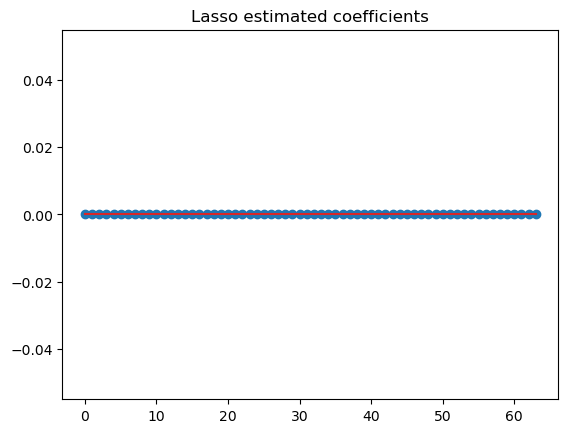

In [38]:
#plot of the coeficients estimated
import matplotlib.pyplot as plt
plt.stem(lasso_predictor.coef_)
plt.title("Lasso estimated coefficients")
plt.show()
 

*Interpretation*:
- we can observe that both MSE scores fro training and test are high and the R² scores are around 0, meaning our model is no better then a model who get the mean of the y_true everytime. The fact that our R² for both training and test are close to 0 means that our model is underfitting. This is mainly because the lasso methode uses the L1 norm and is known for sparcity. In order to solve this we need to reduce our alpha. We chose the by default alpha which equal to 1.0 (way bigger then our parameters). 
- the previous hypothesis is confirmed by the plot of the coeficient (all of them are nullified). So clearly this is a sign of underfitting and of model sparcity

#### Question 3: plot evolution of MSE for 
$$
\lambda \in [10^{-5}, 10^{-3}]
$$

In [39]:
lambda_range=np.logspace(-3,5,100)
train_y_predict=[]
test_y_predict=[]
parameters=[]

In [40]:
for alpha in lambda_range:
    model=sklearn.linear_model.Lasso(alpha=alpha,fit_intercept=True)
    model.fit(x_train,y_train)
    train_y_predict.append(model.predict(x_train))
    test_y_predict.append(model.predict(x_test))
    parameters.append(model.coef_)
    

In [41]:
train_mse_scores=[]
test_mse_scores=[]
for i in range(0,100):
    #train
    train_mse_scores.append(sklearn.metrics.mean_squared_error(y_train,train_y_predict[i]))
    #test
    test_mse_scores.append(sklearn.metrics.mean_squared_error(y_test,test_y_predict[i]))

In [42]:
train_mse_scores=np.array(train_mse_scores)
test_mse_scores=np.array(test_mse_scores)
parameters=np.array(parameters)

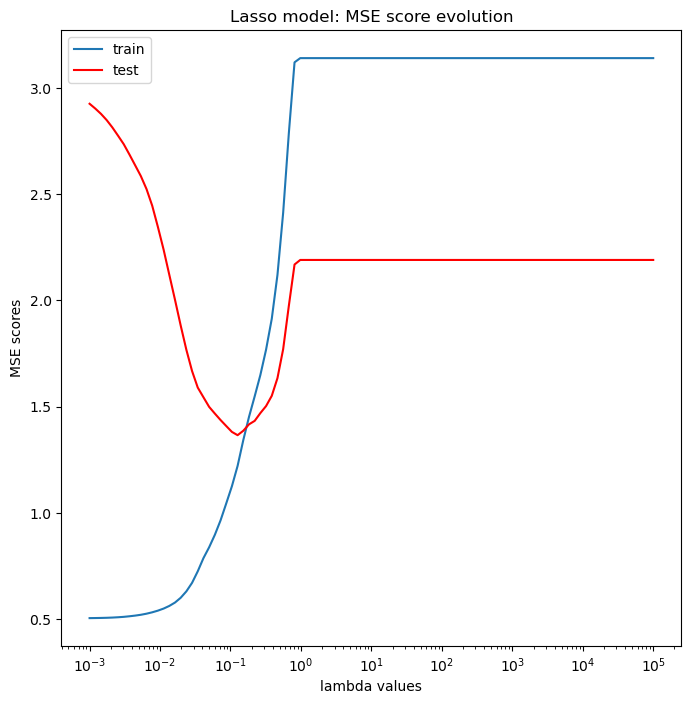

In [43]:
#plot evolution of MSE on training and test data as a function of lambda

fig, ax = plt.subplots(figsize=(8, 8))

#train data
ax.semilogx(lambda_range,train_mse_scores,label='train')
ax.set_title('Lasso model: MSE score evolution')
ax.set_xlabel('lambda values')
ax.set_ylabel('MSE scores')

ax.semilogx(lambda_range,test_mse_scores,c='red',label='test')
ax.legend()


plt.show()


*Interpretation*:
- Same observation as for the regularization with Ridge.
- An interesting insight is that in the previous plot with Ridge, the minimum was smooth because we use the L2 norm for regularization.
Here, with Lasso, we see that the minimum is non-smooth, which highlights the effect of using a non-smooth function (the L1 norm) for regularization.

#### Question 4: select best lamba value

In [44]:
best_lbmd=lambda_range[np.argmin(test_mse_scores)]
print('best lambda',best_lbmd)
best_lasso_predictor=sklearn.linear_model.Lasso(alpha=best_lbmd,fit_intercept=True)



best lambda 0.1261856883066021


In [45]:
#fit model first
best_lasso_predictor.fit(x_train,y_train)

#predict
y_train_predict=best_lasso_predictor.predict(x_train)
y_test_predict=best_lasso_predictor.predict(x_test)

#### Question 5: plot the predictions

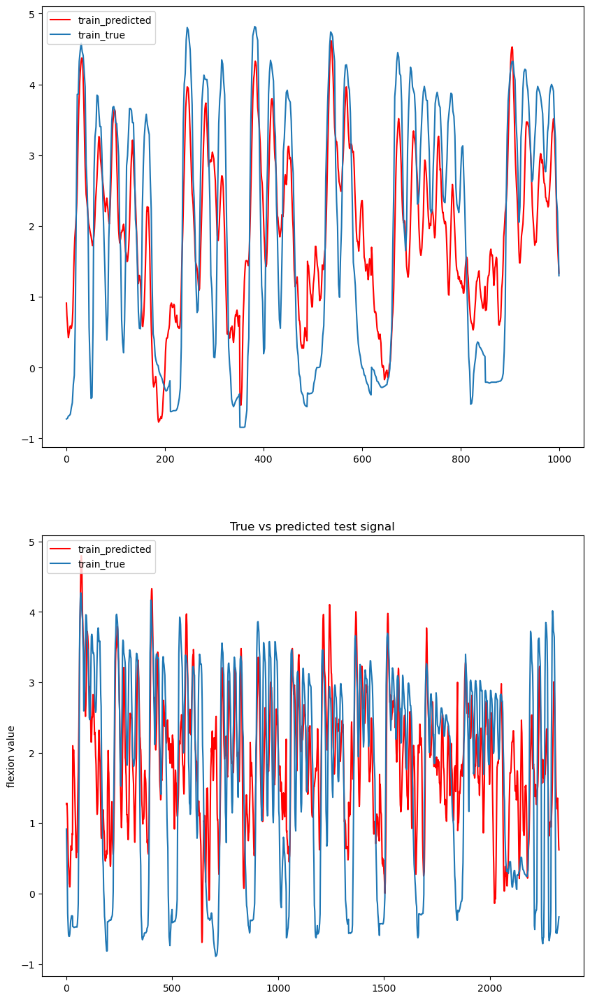

In [46]:
#plot of true VS predicted 
#plot with real values of training

fig, ax = plt.subplots(2,1,figsize=(10, 18))
#train
ax[0].plot(y_train_predict,c='red',label='train_predicted')
ax[0].plot(y_train,label='train_true')
ax[0].legend(loc='upper left')

#test
ax[1].plot(y_test_predict,c='red',label='train_predicted')
ax[1].plot(y_test,label='train_true')
ax[1].legend(loc='upper left')
ax[1].set_title('True vs predicted test signal')
plt.ylabel('flexion value')
plt.show()



#### Question 6: Check the coeficients

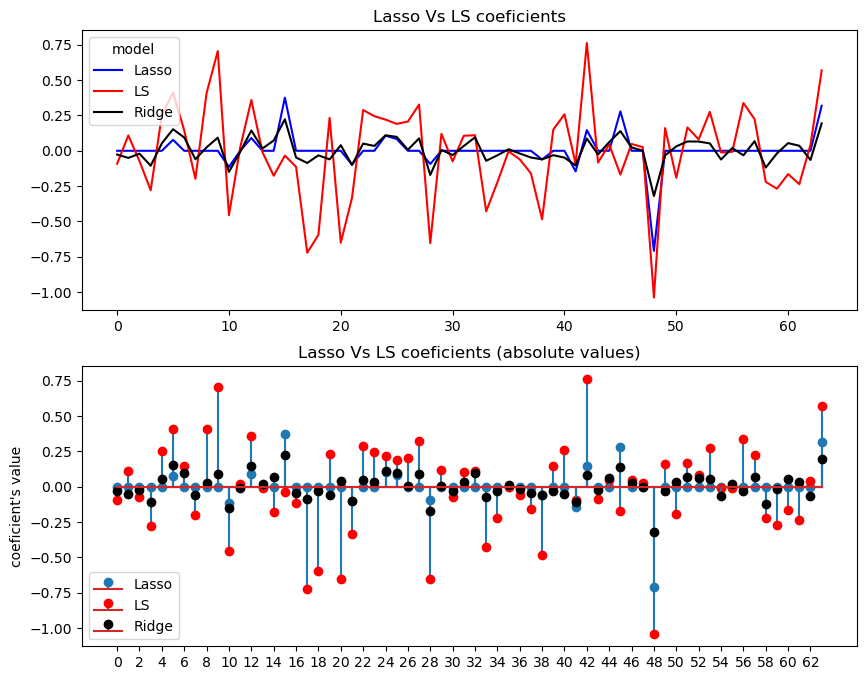

In [47]:
fig, ax = plt.subplots(2,1,figsize=(10, 8))

ax[0].plot(best_lasso_predictor.coef_,c='blue',label='Lasso')
ax[0].plot(w_hat[1:],c='red',label='LS') #don't include the intercept
ax[0].plot(model_ridge.coef_,c='black',label='Ridge')
ax[0].legend(title='model',loc='upper left')
ax[0].set_title('Lasso Vs LS coeficients')

ax[1].stem(best_lasso_predictor.coef_,label='Lasso')
ax[1].stem(w_hat[1:],label='LS',markerfmt='red') #don't include the intercept
ax[1].legend(title='model',loc='upper left')
ax[1].stem(model_ridge.coef_,markerfmt='black',label='Ridge')
ax[1].set_title('Lasso Vs LS coeficients (absolute values)')
plt.legend()


plt.xticks(np.arange(0, len(best_lasso_predictor.coef_), step=2))

plt.ylabel('coeficient\'s value')
plt.show()


    *Interpretation*:
    
- We can observe the sparse behavior of Lasso in the plot above: compared to least squares and even ridge, many coefficients are pushed closer to zero or even exactly zero.
- Lasso’s non-smooth L1 penalty encourages exact zeros while allowing large coefficients to remain relatively large, whereas ridge shrinks all coefficients smoothly toward zero. As a result, the large coefficients (e.g., 48, 42, 9) are less aggressively shrunk by Lasso than by ridge.

#### Question 7: Features selected by lasso

In [48]:
n_selected = np.sum(best_lasso_predictor.coef_ != 0)
n_total = len(best_lasso_predictor.coef_)

print(f"Lasso selected {n_selected} out of {n_total} features.")
print(f"Feature reduction: {100 * (1 - n_selected / n_total):.1f}%")

Lasso selected 14 out of 64 features.
Feature reduction: 78.1%


#### Performance of Lasso

In [49]:
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)


#store score
score_model.append(['Lasso Regression',mse,r2])


Test MSE score:  1.3659542352560026
Test R² score:  0.3594512149442919


### Nonlinear Regression 

#### Random Forest Regressor

In [50]:
#Initiate
rf_model=sklearn.ensemble.RandomForestRegressor()
#Fit 
rf_model.fit(x_train,y_train.ravel())
#fir
y_test_predict=rf_model.predict(x_test)
#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)


Test MSE score:  1.652281969940398
Test R² score:  0.22518106310024488


*Interpretation*:
- the Random Forest Regressor without optimizing the parameters gave similar score to the best ridge model we had. So maybe an optimization of the Rf model could help us attain new hights. For this we will use a grid search to define the best model and the best parameters.

In [51]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error


param_grid = {
    "n_estimators": [100, 200],
    "max_depth": [None, 5],
}

mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

grid_search = GridSearchCV(sklearn.ensemble.RandomForestRegressor(random_state=0), 
                           param_grid, 
                           scoring=mse_scorer, 
                           cv=5)
grid_search.fit(x_train, y_train.ravel())

print("Best parameters:", grid_search.best_params_)
print("Best CV MSE:", -grid_search.best_score_)

Best parameters: {'max_depth': None, 'n_estimators': 100}
Best CV MSE: 1.9432095404019847


In [53]:
best_rf_model=grid_search.best_estimator_
y_predict_best_rf=best_rf_model.predict(x_test)

#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_predict_best_rf)
r2=sklearn.metrics.r2_score(y_test,y_predict_best_rf)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)

score_model.append(['RandomForest',mse,r2])

Test MSE score:  1.64281562414951
Test R² score:  0.22962019886245733


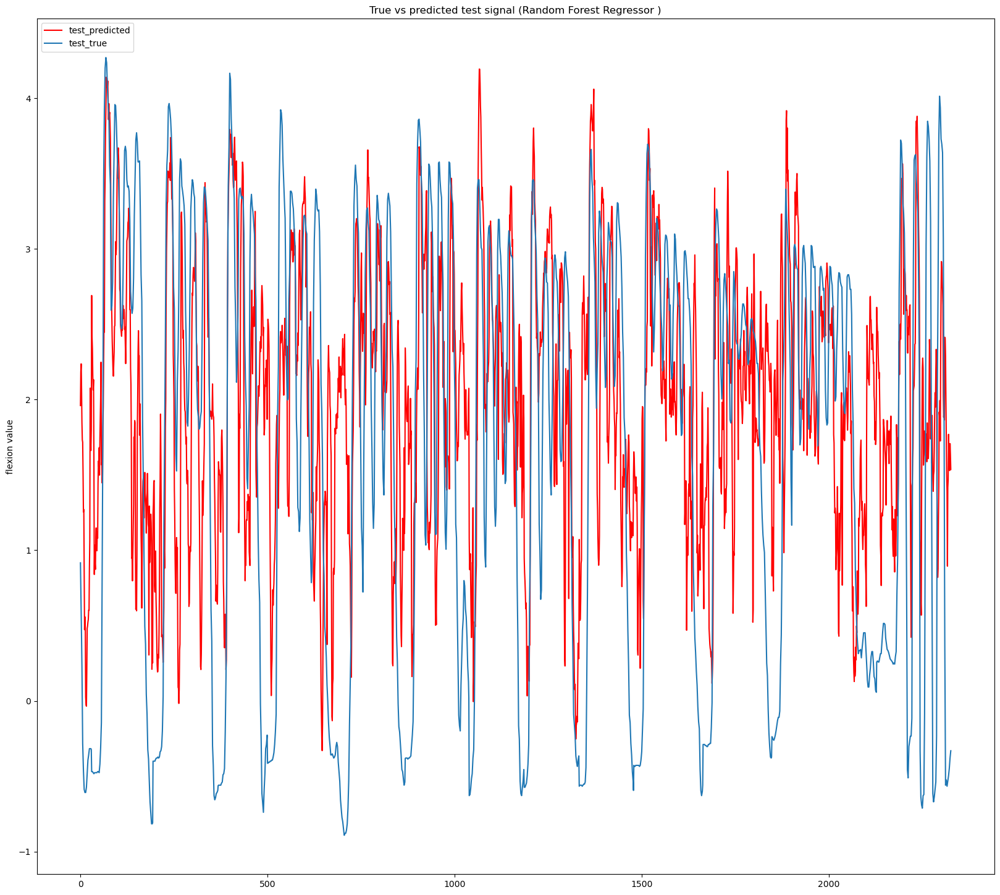

In [54]:
#plot of true VS predicted 
#plot with real values of training

fig, ax = plt.subplots(figsize=(20, 18))

#test
ax.plot(y_test_predict,c='red',label='test_predicted')
ax.plot(y_test,label='test_true')
ax.legend(loc='upper left')
ax.set_title('True vs predicted test signal (Random Forest Regressor )')
plt.ylabel('flexion value')
plt.show()

#### Support Regression Vector

In [55]:
#Initiate
svr_model=sklearn.svm.SVR()
#Fit 
svr_model.fit(x_train,y_train.ravel())
#fir
y_test_predict=svr_model.predict(x_test)
#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)


Test MSE score:  1.515182870123942
Test R² score:  0.28947213490412815


In [56]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

pipeline = make_pipeline(StandardScaler(), sklearn.svm.SVR())

param_grid = {
    'svr__kernel': ['rbf', 'linear'],
    'svr__C': [0.1, 1, 10],
    'svr__gamma': ['scale', 'auto'],
    'svr__epsilon': [0.01, 0.1]
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='r2',  
    cv=5,              
    n_jobs=-1)

grid_search.fit(x_train,y_train.ravel())

print("Best parameters:", grid_search.best_params_)
print("Best cross-val:", -grid_search.best_score_)

Best parameters: {'svr__C': 10, 'svr__epsilon': 0.01, 'svr__gamma': 'scale', 'svr__kernel': 'rbf'}
Best cross-val: -0.40387703607116654


In [57]:
best_svr_model=grid_search.best_estimator_
y_predict_best_svr=best_svr_model.predict(x_test)

#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)

score_model.append(['SVR',mse,r2])

Test MSE score:  1.515182870123942
Test R² score:  0.28947213490412815


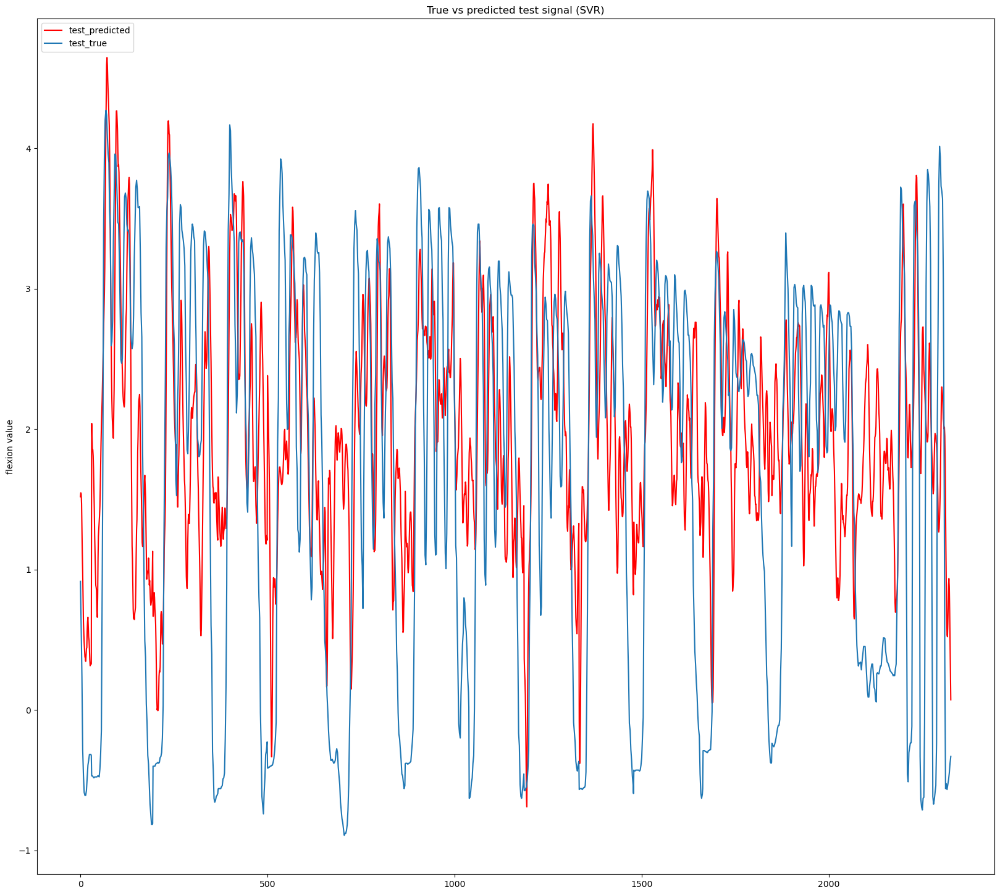

In [58]:
#plot of true VS predicted 
#plot with real values of training

fig, ax = plt.subplots(figsize=(20, 18))

#test
ax.plot(y_test_predict,c='red',label='test_predicted')
ax.plot(y_test,label='test_true')
ax.legend(loc='upper left')
ax.set_title('True vs predicted test signal (SVR)')
plt.ylabel('flexion value')
plt.show()

#### MLP Regressor
- Error in PDF mentionned to do the MLPClassifier but our target is continuous hence we will use the MLP Regressor 

In [59]:
#Initiate
scaler=StandardScaler()
mlp_model=sklearn.neural_network.MLPRegressor(random_state=42)
#Fit 
mlp_model.fit(scaler.fit_transform(x_train),y_train.ravel())
#fir
y_test_predict=mlp_model.predict(scaler.fit_transform(x_test))
#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)


Test MSE score:  2.2525448299391084
Test R² score:  -0.056305414090682016


In [60]:
# Define the MLP Regressor
mlp = sklearn.neural_network.MLPRegressor(random_state=42, max_iter=1000)

# Define the parameter grid
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive']
}

grid_search = GridSearchCV(estimator=mlp, param_grid=param_grid,
                           cv=5, scoring='r2', n_jobs=-1, verbose=2)

grid_search.fit(scaler.fit_transform(x_train), y_train.ravel())

print("Best parameters found:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=constant, solver=adam; total time=   1.0s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=adaptive, solver=adam; total time=   1.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=constant, solver=adam; total time=   1.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=constant, solver=adam; total time=   1.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=adaptive, solver=adam; total time=   1.1s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=constant, solver=adam; total time=   1.2s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=constant, solver=adam; total time=   1.5s
[CV] END activation=relu, alpha=0.0001, hidden_layer_sizes=(50,), learning_rate=adap

In [61]:

best_mlp = grid_search.best_estimator_
y_pred_best_mlp = best_mlp.predict(x_test)

#performances
mse=sklearn.metrics.mean_squared_error(y_test,y_test_predict)
r2=sklearn.metrics.r2_score(y_test,y_test_predict)
print('Test MSE score: ',mse)
print('Test R² score: ',r2)

score_model.append(['MLP',mse,r2])

Test MSE score:  2.2525448299391084
Test R² score:  -0.056305414090682016


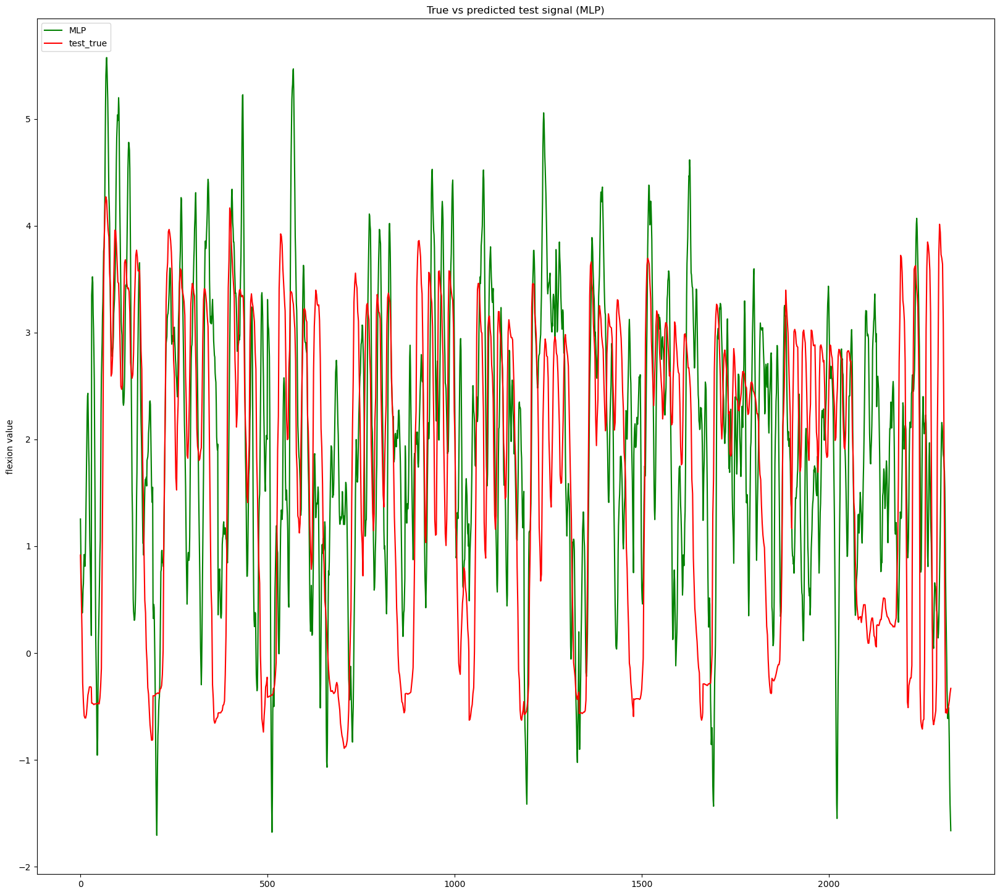

In [62]:
#plot of true VS predicted 
#plot with real values of training

fig, ax = plt.subplots(figsize=(20, 18))

#test

# ax.plot(y_predict_best_rf,label='RF',c='black')
# ax.plot(y_predict_best_svr,label='SVR',c='blue')
ax.plot(y_pred_best_mlp,c='green',label='MLP')
ax.plot(y_test,label='test_true',c='red')
ax.legend(loc='upper left')
ax.set_title('True vs predicted test signal (MLP)')
plt.ylabel('flexion value')
plt.show()

*Interpretation on nonlinear regression:*
- By default SVR and Random forest regressor have a great performs with numbers similar to the results of the best ridge regression model. As for MLP the results aren't very promising as they fall behind. This maybe due to the fact that MLPRgressor easily overfit (not enough training data for a neural network). 
- As for the effect of parameter selection, it wasn't very interessting for all the models as the perfromances weren't affected. 
- For the plots RF and SVR seem to have a similar plots as the previous models. In MLP we can clealry see extreme values (the same we saw in training set), hence this is a clear sign of overfitting.

### Final comparison

In [65]:
#create DF
df_score_model=pd.DataFrame(score_model,columns=['name','MSE','R²'])
df_score_model

,name,MSE,R²
0,Least Square,3.045537,-0.428170
1,Linear Regression,3.045537,-0.428170
2,Ridge Regression,1.623906,0.238488
3,Lasso Regression,1.365954,0.359451
4,RandomForest,1.642816,0.229620
5,SVR,1.515183,0.289472
6,MLP,2.252545,-0.056305


*Interpretation*:
- From our scoring table we can clearly say that the lasso model gives the best perfromance both on the MSE and R² score. But greate candidates can be Ridge regression, Random Forrest and even SVR. 

- Clearly, linear models are the most interpretable, since a quick look at the coefficients helps us determine the most important features for prediction (the coefficients with high norms). For our main purpose, which is determining which part of the brain can detect finger flexion, a linear model is the most obvious choice, as we can easily interpret which cathode/signal to observe in order to predict flexion. Hence, we can keep the Lasso and Ridge models. In this application, non-linearity actually reduces interpretability. In fact, doctors are sure that there is a link between finger flexion and certain brain parts, and we want to follow this path. So, using non-linear models could be interesting from a performance point of view, but in our case, it does not make clear sense.

- By definition, we never use test data for validation, as it would interfere with the final results. Test data is only used to evaluate how our model predicts on new, unseen data. For predictions in production, we can split our training data into training and validation sets, use cross-validation to improve the model, and then test it on the separate test set to assess performance. Once the performance is validated and approved, we can deploy the model in production.